# Lab 3: The geometry of two views

In this lab you will learn how to estimate the fundamental matrix that relates two images, corresponding to two different views of the same scene, given a set of correspondences between them. Then, you will apply the estimation of the fundamental matrix to solve the photo-sequencing problem.

The following file combines some text cells (Markdown cells) and code cells. Some parts of the code need to be completed. All tasks you need to complete are marked in <span style='color:Green'> green.  </span>

In [2]:
import numpy as np
from numpy import linalg as LA
import cv2
import math
import sys
import random
import matplotlib
from matplotlib import pyplot as plt
from operator import itemgetter
from PIL import Image, ImageDraw
from utils import line_draw, plot_img
import pickle

## **1. Estimation of the fundamental matrix**

### **1.1 DLT algorithm**

The first task is to create the function that estimates the fundamental matrix given a set of point correspondences between a pair of images.

<span style='color:Green'> - Complete the function "fundamental_matrix" below.  </span>

<span style='color:Blue'> First, we use the function *normalize_points* so that the centroid of the 
normalized points is the origin and their mean square distance from the origin is 2 pixels.  </span>

In [3]:
def normalize_points(points):

    points = points/points[2,:]

    # Centroid of given points
    points_centroid = np.empty(shape=(2,))
    points_centroid[0] = np.mean(points[0,:])
    points_centroid[1] = np.mean(points[1,:])

    # Mean distance to origin
    points_origin = np.empty(shape=(2,points.shape[1]))
    points_origin[0,:] = points[0,:] - points_centroid[0]
    points_origin[1,:] = points[1,:] - points_centroid[1]
    distances = np.sqrt(points_origin[0,:]**2 + points_origin[1,:]**2)
    mean_d = np.mean(distances)

    # Scaling factor
    s = np.sqrt(2)/mean_d
    
    # Translation factor
    t = [-s*points_centroid[0], -s*points_centroid[1]]
    T = np.array([[s, 0, t[0]], 
                  [0, s, t[1]],
                  [0, 0, 1]])
    
    points_norm = T @ points

    return points_norm, T

<span style='color:Blue'> We can call the function *check_normalization* to check if the normalization has been
implemented correctly. </span>

In [4]:
def check_normalization(points, points_id):
    print(f'Points {points_id}:')

    # Print options
    np.set_printoptions(precision=3, suppress=True)
    
    # Centroid of the normalized points (should be 0)
    points_centroid = np.empty(shape=(2,))
    points_centroid[0] = np.mean(points[0,:])
    points_centroid[1] = np.mean(points[1,:])
    print(f' - centroid: {points_centroid}')

    # Mean square distance between the origin and the data points (should be 2)
    distances = np.sqrt(points[0,:]**2 + points[1,:]**2)
    mean_distance = np.mean(distances)**2
    print(f' - mean square distance: {mean_distance}')

<span style='color:Blue'> Let's complete the function *fundamental_matrix*</span>

In [5]:
def fundamental_matrix(points1, points2, check_norm=False):
    '''  
    Steps:
    0. Normalize points
    1. Create matrix W from pi and p’i correspondences
    2. Compute the SVD of matrix W=UDVT
    3. Create vector f from last column of V
    4. Compose fundamental matrix F_rank3
    5. Compute the SVD of fundamental matrix F_rank3 = UDVT
    6. Remove last singular value of D to create Ď
    7. Re-compute matrix F = U Ď VT (rank 2)
    8. Denormalize
    '''

    # Step 0. Normalize points (translation and scaling)
    points1, T1 = normalize_points(points1)
    points2, T2 = normalize_points(points2)

    # To check if the points are correctly normalized
    if check_norm:
        check_normalization(points1, '1')
        check_normalization(points2, '2')

    # Step 1. Create matrix W from pi and p’i correspondences. 
    # W has shape 8x9 if we use 8 correspondences
    points1 = points1.T
    points2 = points2.T
    W = np.ones(shape=(points1.shape[0], 9))

    W[:,0] = points1[:,0] * points2[:,0]
    W[:,1] = points1[:,1] * points2[:,0]
    W[:,2] = points2[:,0]
    W[:,3] = points1[:,0] * points2[:,1]
    W[:,4] = points1[:,1] * points2[:,1]
    W[:,5] = points2[:,1]
    W[:,6] = points1[:,0]
    W[:,7] = points1[:,1]

    # Step 2. Compute the SVD of matrix W=UDVT
    _, _, VT = LA.svd(W)

    # Step 3. Create vector f from the last column of V (last row of VT)
    # Step 4. Compose fundamental matrix F_rank3
    Fr3 = VT[-1,:].reshape(3,3)

    # Step 5. Compute the SVD of fundamental matrix F_rank3 = UDVT
    U, D, VT = LA.svd(Fr3)

    # Step 6. Remove last singular value of D
    D[-1] = 0
    D = np.diag(D)

    # Step 7. Recompute F (rank 2)
    Fr2 = U @ D @ VT

    # Step 8. Denormalize
    Fr2 = T2.T @ Fr2 @ T1

    return Fr2

In order to check that the completed function works properly you may use this code which is a toy example where we know the ground truth image.

<span style='color:Green'> - Complete the expression of the ground truth fundamental matrix.  </span>

In [7]:
def gt_fundamental_matrix(R, t):
    t_x = [[0, -t[0][2], t[0][1]],
          [t[0][2], 0, -t[0][0]],
          [-t[0][1], t[0][0], 0]]

    return t_x @ R

# Two camera matrices for testing purposes
P1 = np.zeros((3,4))
P1[0,0]=P1[1,1]=P1[2,2]=1
angle = 15
theta = np.radians(angle)
c = np.cos(theta)
s = np.sin(theta)
R = np.array([[c, -s, 0], [s, c, 0], [0, 0, 1]])
t = np.array([[.3, .1, .2]])

P2 = np.concatenate((R, t.T), axis=1)
n = 8
rand = np.random.uniform(0,1,n)
rand = rand.reshape((1, n))
rand2 = np.random.uniform(0,1,2*n)
rand2 = rand2.reshape((2, n))
ones = np.ones((1,n))
X = np.concatenate((rand2, 3*rand, ones), axis=0)

x1_test = P1 @ X
x2_test = P2 @ X

# Estimate fundamental matrix
F_es = fundamental_matrix(x1_test, x2_test, check_norm=True)

# Ground truth fundamental matrix
F_gt = gt_fundamental_matrix(R, t)

# Evaluation: these two matrices should be very similar
F_gt = np.sign(F_gt[0,0])*F_gt / LA.norm(F_gt)
F_es = np.sign(F_es[0,0])*F_es / LA.norm(F_es)
print('------------------------')
print(f'F groundtruth:\n{F_gt}')
print(f'F estimated:\n{F_es}')
print(f'Error: {LA.norm(F_gt-F_es):.2f}')

Points 1:
 - centroid: [0. 0.]
 - mean square distance: 2.0000000000000004
Points 2:
 - centroid: [0. 0.]
 - mean square distance: 2.000000000000001
------------------------
F groundtruth:
[[ 0.098  0.365 -0.189]
 [-0.365  0.098  0.567]
 [ 0.036 -0.597 -0.   ]]
F estimated:
[[ 0.098  0.365 -0.189]
 [-0.365  0.098  0.567]
 [ 0.036 -0.597  0.   ]]
Error: 0.00


<span style='color:blue'> Another way to check if F is correctly estimated -> p2.T @ F @ p1 should be 0
 </span>

In [11]:
# Idx of the point to use
pidx = 1

# Select point pidx from x1_test and x2_test and express them in homogeneous coordinates
p1 = x1_test.T[pidx]
p1 = p1 / p1[2]
p2 = x2_test.T[pidx]
p2 = p2 / p2[2]

print(f'p2.T @ F @ p1: {p2.T @ F_es @ p1:.2f}')

p2.T @ F @ p1: 0.00


### **1.2 Robust estimation of the fundamental matrix**

The goal of this section is to estimate the fundamental matrix in a practical situation where the image correspondences contain outliers. For that you will have to write the code of the robust version of the previous algorithm.

We will start by computing and visualizing the image matches.

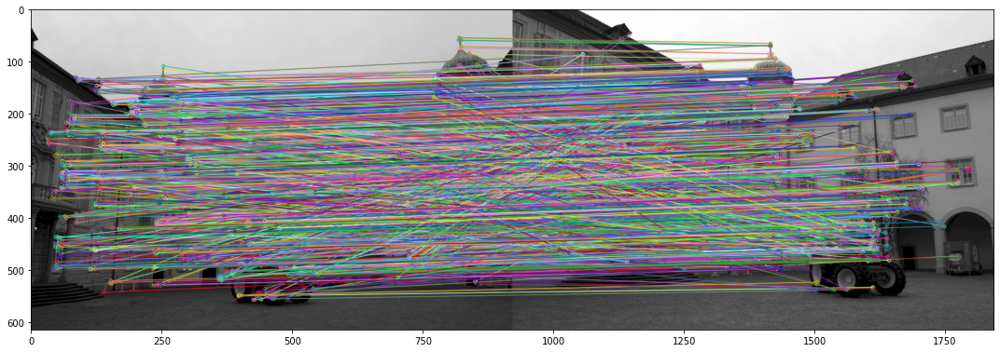

In [36]:
# Compute image correspondences #

# Read images
img1 = cv2.imread('Data/0000_s.png',cv2.IMREAD_GRAYSCALE)
img2 = cv2.imread('Data/0001_s.png',cv2.IMREAD_GRAYSCALE)

# Initiate ORB detector
orb = cv2.ORB_create(3000)
# find the keypoints and descriptors with ORB
kp1, des1 = orb.detectAndCompute(img1,None)
kp2, des2 = orb.detectAndCompute(img2,None)

# Keypoint matching
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
matches = bf.match(des1,des2)

# Show "good" matches
img_12 = cv2.drawMatches(img1,kp1,img2,kp2,matches,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.imshow(img_12)
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(18.5, 10.5)
plt.show()

<span style='color:Green'> - Write the function Ransac_fundamental_matrix that embeds in a RANSAC procedure the previous DLT algorithm for estimating the fundamental matrix. You may use the provided RANSAC function in lab 2 as a starting point.  </span>

Note: In order not to end up, eventually, in an infinite loop, it is recommended to set, at each iteration, the maximum number of iterarions to the maximum between a predefined maximum number of iterations by the user and the automatically estimated max. number of iterarions. The estimated number of iterations ensures we pick, with a probability of 0.99, an initial set of correspondences with no outliers.

<span style='color:Blue'> First, with the function *Inliers*  we check if a point is an inlier using the Sampson
distance</span>

In [13]:
def Normalise_last_coord(x):    
    return x / x[2,:]

# Function from last week tweaked a little bit
def Inliers(F, points1, points2, th):

    inliers = []

    points1 = Normalise_last_coord(points1)
    points2 = Normalise_last_coord(points2)

    points1 = np.transpose(points1)
    points2 = np.transpose(points2)
    
    for pidx,p1 in enumerate(points1):
        p2 = points2[pidx]

        # We check if a point is an inlier using the Sampson distance
        Fp1 = F @ p1
        Ftp2 = F.T @ p2

        Fp1 = Fp1/Fp1[2]
        Ftp2 = Ftp2/Ftp2[2]

        num = (p2.T @ F @ p1)**2    
        denom = Fp1[0]**2 \
               + Fp1[1]**2 \
               + Ftp2[0]**2 \
               + Ftp2[1]**2      

        d = num/denom

        if (d < th**2):
            inliers.append(pidx)
    
    return np.array(inliers)

<span style='color:Blue'> Then, we complete the function *Ransac_fundamental_matrix*. </span>

In [14]:
def Ransac_fundamental_matrix(points1, points2, th, max_it_0):
    best_inliers = np.empty(1)
    it = 0

    while it < max_it_0:
        indices = random.sample(range(1, points1.shape[1]), 8)
    
        F = fundamental_matrix(points1[:,indices], points2[:,indices])
        inliers = Inliers(F, points1, points2, th)
        
        if inliers.shape[0] > best_inliers.shape[0]:
            best_inliers = inliers

        fracinliers = inliers.shape[0]/points1.shape[1]
        pNoOutliers = 1 - fracinliers**4
        eps = sys.float_info.epsilon
        pNoOutliers = max(eps, pNoOutliers)   # avoid division by -Inf
        pNoOutliers = min(1-eps, pNoOutliers) # avoid division by 0
        p = 0.99
        max_it = math.log(1-p)/math.log(pNoOutliers)
        it += 1
        
        # To avoid an infinite loop
        max_it_0 = min(max_it,max_it_0)

    print(f'Total # iterations: {it}')
    print(f'Total # inliers: {best_inliers.shape[0]}')
    F = fundamental_matrix(points1[:, best_inliers], points2[:, best_inliers])
    inliers = best_inliers
    
    return F, inliers

<span style='color:Blue'> Let's estimate F and plot the inliers. </span>

Total # iterations: 1039
Total # inliers: 440


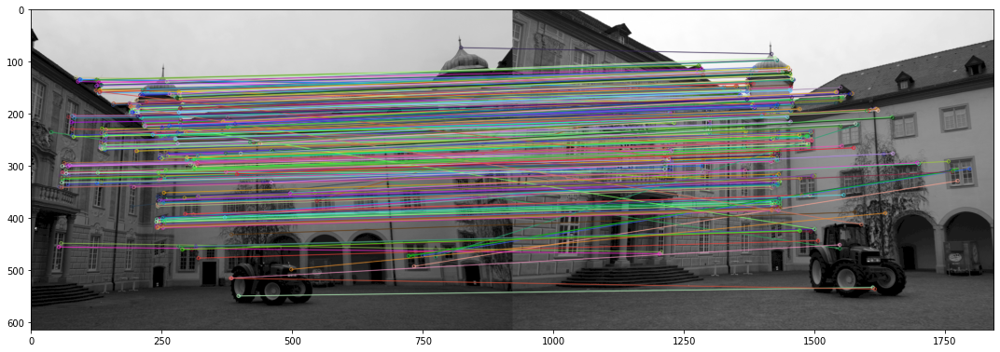

In [22]:
# Robust estimation of the fundamental matrix #
points1 = []
points2 = []
for m in matches:
    points1.append([kp1[m.queryIdx].pt[0], kp1[m.queryIdx].pt[1], 1])
    points2.append([kp2[m.trainIdx].pt[0], kp2[m.trainIdx].pt[1], 1])
    
points1 = np.asarray(points1)
points1 = points1.T
points2 = np.asarray(points2)
points2 = points2.T

F, indices_inlier_matches = Ransac_fundamental_matrix(points1, points2, th=1, max_it_0=5000)
inlier_matches = itemgetter(*indices_inlier_matches)(matches)

img_12 = cv2.drawMatches(img1,kp1,img2,kp2,inlier_matches,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.imshow(img_12)
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(18.5, 10.5)
plt.show()

### **1.3 Epipolar lines**

Now that the fundamental matrix has been mestimated we are going to display some points and their corresponding epipolar lines.

<span style='color:Green'> - Complete the code that computes the epipolar lines in both images.  </span>

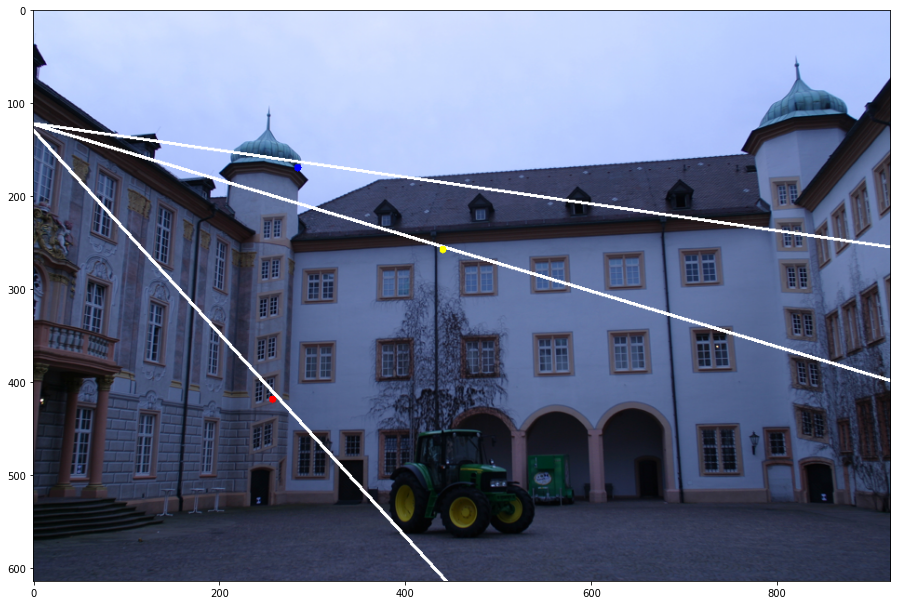

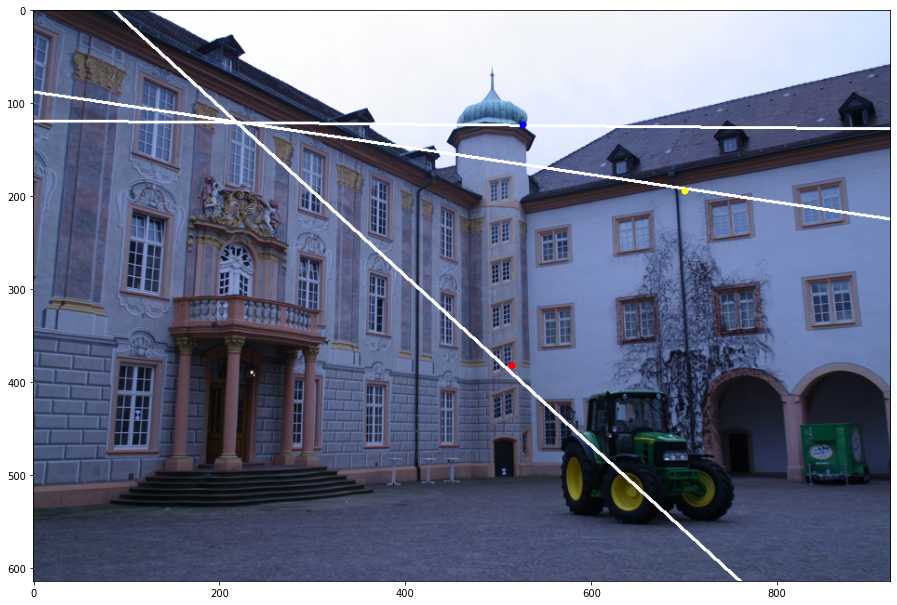

In [27]:
l2 = F @ points1 # epipolar lines in image 2
l1 = F.T @ points2 # epipolar lines in image 1

# choose three random indices
N = indices_inlier_matches.shape[0]
indices = random.sample(range(1, N), 3)

m1 = indices_inlier_matches[indices[0]]
m2 = indices_inlier_matches[indices[1]]
m3 = indices_inlier_matches[indices[2]]

img_path = "./Data/0000_s.png"
I = Image.open(img_path)
size = I.size
canv = ImageDraw.Draw(I)
line_draw(l1[:,m1], canv, size)
line_draw(l1[:,m2], canv, size)
line_draw(l1[:,m3], canv, size)
canv.ellipse((round(points1[0,m1]), round(points1[1,m1]), round(points1[0,m1])+7, round(points1[1,m1])+7), fill = 'blue', outline ='blue')
canv.ellipse((round(points1[0,m2]), round(points1[1,m2]), round(points1[0,m2])+7, round(points1[1,m2])+7), fill = 'yellow', outline ='yellow')
canv.ellipse((round(points1[0,m3]), round(points1[1,m3]), round(points1[0,m3])+7, round(points1[1,m3])+7), fill = 'red', outline ='red')
fig = plot_img(I)
fig.set_size_inches(18.5,10.5)

img_path = "./Data/0001_s.png"
I2 = Image.open(img_path)
size = I2.size
canv2 = ImageDraw.Draw(I2)
line_draw(l2[:,m1], canv2, size)
line_draw(l2[:,m2], canv2, size)
line_draw(l2[:,m3], canv2, size)
canv2.ellipse((round(points2[0,m1]), round(points2[1,m1]), round(points2[0,m1])+7, round(points2[1,m1])+7), fill = 'blue', outline ='blue')
canv2.ellipse((round(points2[0,m2]), round(points2[1,m2]), round(points2[0,m2])+7, round(points2[1,m2])+7), fill = 'yellow', outline ='yellow')
canv2.ellipse((round(points2[0,m3]), round(points2[1,m3]), round(points2[0,m3])+7, round(points2[1,m3])+7), fill = 'red', outline ='red')
fig = plot_img(I2)
fig.set_size_inches(18.5,10.5)


<span style='color:Blue'> To evaluate the results quantitatively, we can compute the distances from the points to
the corresponding epipole lines.</span>

In [29]:
# to compute the distance from a point to a line (https://en.wikipedia.org/wiki/Distance_from_a_point_to_a_line)
def distance_point_line(line, point):
    a,b,c = line
    xo,yo = point
    return np.abs(a*xo + b*yo + c) / np.sqrt(a**2 + b**2)

 <span style='color:Blue'> Let's do it for images 1 and 2</span>

In [30]:
print('--- Image 1 ---')

points1 = points1[:2]/points1[2]
points2 = points2[:2]/points2[2]

# red point
d1_img1 = distance_point_line(l1[:,m1], points1[:,m1])
print(f'Distance from blue point to epipole line: {d1_img1:.2f}')
# yellow point
d2_img1 = distance_point_line(l1[:,m2], points1[:,m2])
print(f'Distance from yellow point to epipole line: {d2_img1:.2f}')
# blue point
d3_img1 = distance_point_line(l1[:,m3], points1[:,m3])
print(f'Distance from red point to epipole line: {d3_img1:.2f}')

print('--- Image 2 ---')
# red point
d1_img2 = distance_point_line(l2[:,m1], points2[:,m1])
print(f'Distance from blue point to epipole line: {d1_img2:.2f}')
# yellow point
d2_img2 = distance_point_line(l2[:,m2], points2[:,m2])
print(f'Distance from yellow point to epipole line: {d2_img2:.2f}')
# blue point
d3_img2 = distance_point_line(l2[:,m3], points2[:,m3])
print(f'Distance from red point to epipole line: {d3_img2:.2f}')

--- Image 1 ---
Distance from blue point to epipole line: 3.49
Distance from yellow point to epipole line: 0.40
Distance from red point to epipole line: 5.92
--- Image 2 ---
Distance from blue point to epipole line: 3.61
Distance from yellow point to epipole line: 0.42
Distance from red point to epipole line: 6.50


#### Using SIFT
<span style='color:Blue'> When using ORB to detect keypoints, we can observe that there are too many outliers, so the
correct estimation of the fundamental matrix depends mainly on RANSAC. Even if this method is robust to outliers,
in some cases it might wrongly estimate F, which makes it quite unstable. We don't want to depend on the randomness 
of RANSAC, so let's try the same process using SIFT, to see if the number of outliers is reduced. </span>

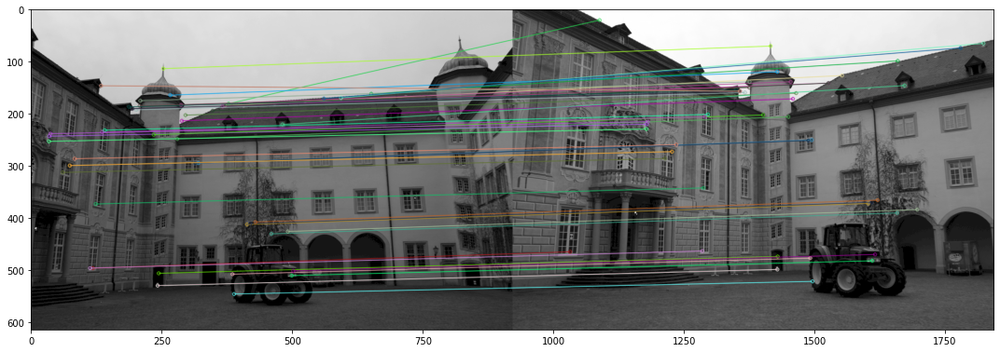

In [39]:
# Compute image correspondences #

# Read images
img1 = cv2.imread('Data/0000_s.png',cv2.IMREAD_GRAYSCALE)
img2 = cv2.imread('Data/0001_s.png',cv2.IMREAD_GRAYSCALE)

# Use SIFT keypoint detector and descriptor
SIFTdetector = cv2.xfeatures2d.SIFT_create(nfeatures=600)
kp1, des1 = SIFTdetector.detectAndCompute(img1,None)
kp2, des2 = SIFTdetector.detectAndCompute(img2,None)

# Keypoint matching
bf = cv2.BFMatcher()
matches_init = bf.knnMatch(des1,des2,k=2)

# Apply ratio test
matches = []
for m,n in matches_init:
    if m.distance < 0.65*n.distance:
        matches.append(m)

# Show "good" matches
img_12 = cv2.drawMatches(img1,kp1,img2,kp2,matches,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.imshow(img_12)
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(18.5, 10.5)
plt.show()

Total # iterations: 16
Total # inliers: 39


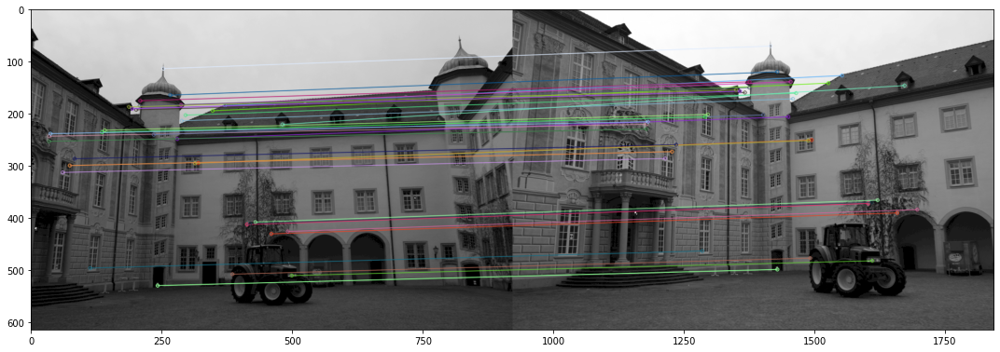

True

In [41]:
# Robust estimation of the fundamental matrix #
points1 = []
points2 = []
for m in matches:
    points1.append([kp1[m.queryIdx].pt[0], kp1[m.queryIdx].pt[1], 1])
    points2.append([kp2[m.trainIdx].pt[0], kp2[m.trainIdx].pt[1], 1])
    
points1 = np.asarray(points1)
points1 = points1.T
points2 = np.asarray(points2)
points2 = points2.T

F, indices_inlier_matches = Ransac_fundamental_matrix(points1, points2, th=1, max_it_0=5000)
inlier_matches = itemgetter(*indices_inlier_matches)(matches)

img_12 = cv2.drawMatches(img1,kp1,img2,kp2,inlier_matches,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.imshow(img_12)
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(18.5, 10.5)
plt.show()

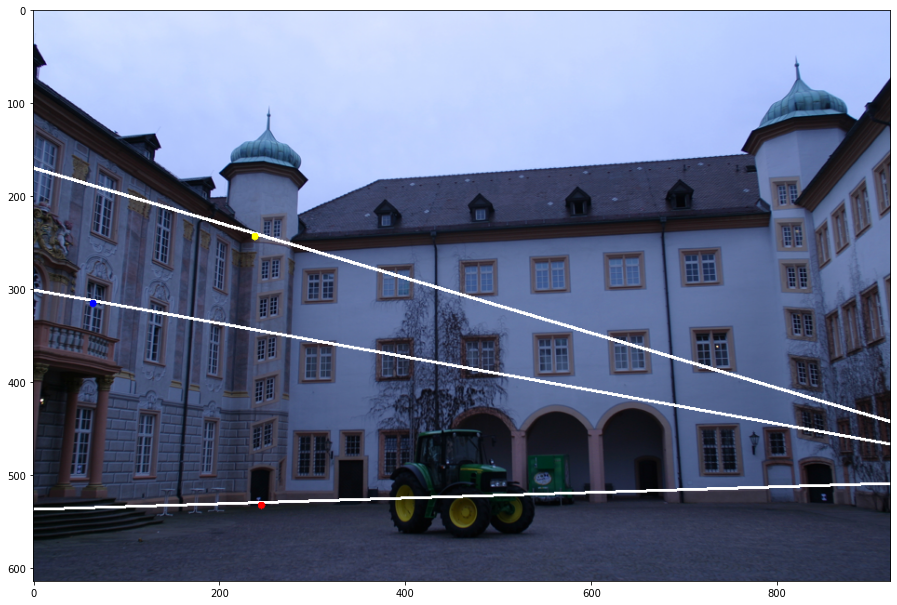

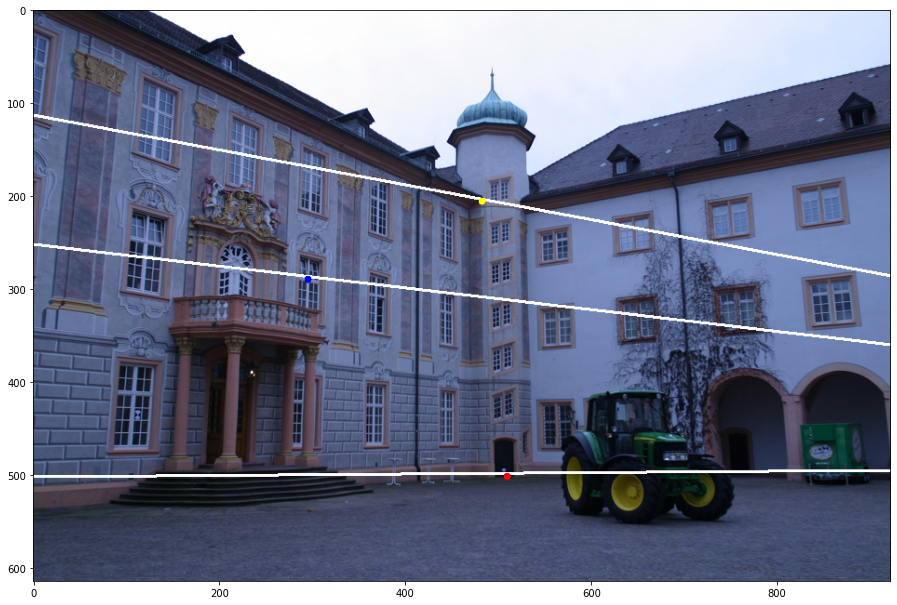

In [43]:
l2 = F @ points1 # epipolar lines in image 2
l1 = F.T @ points2 # epipolar lines in image 1

# choose three random indices
N = indices_inlier_matches.shape[0]
indices = random.sample(range(1, N), 3)

m1 = indices_inlier_matches[indices[0]]
m2 = indices_inlier_matches[indices[1]]
m3 = indices_inlier_matches[indices[2]]

img_path = "./Data/0000_s.png"
I = Image.open(img_path)
size = I.size
canv = ImageDraw.Draw(I)
line_draw(l1[:,m1], canv, size)
line_draw(l1[:,m2], canv, size)
line_draw(l1[:,m3], canv, size)
canv.ellipse((round(points1[0,m1]), round(points1[1,m1]), round(points1[0,m1])+7, round(points1[1,m1])+7), fill = 'blue', outline ='blue')
canv.ellipse((round(points1[0,m2]), round(points1[1,m2]), round(points1[0,m2])+7, round(points1[1,m2])+7), fill = 'yellow', outline ='yellow')
canv.ellipse((round(points1[0,m3]), round(points1[1,m3]), round(points1[0,m3])+7, round(points1[1,m3])+7), fill = 'red', outline ='red')
fig = plot_img(I)
fig.set_size_inches(18.5,10.5)

img_path = "./Data/0001_s.png"
I2 = Image.open(img_path)
size = I2.size
canv2 = ImageDraw.Draw(I2)
line_draw(l2[:,m1], canv2, size)
line_draw(l2[:,m2], canv2, size)
line_draw(l2[:,m3], canv2, size)
canv2.ellipse((round(points2[0,m1]), round(points2[1,m1]), round(points2[0,m1])+7, round(points2[1,m1])+7), fill = 'blue', outline ='blue')
canv2.ellipse((round(points2[0,m2]), round(points2[1,m2]), round(points2[0,m2])+7, round(points2[1,m2])+7), fill = 'yellow', outline ='yellow')
canv2.ellipse((round(points2[0,m3]), round(points2[1,m3]), round(points2[0,m3])+7, round(points2[1,m3])+7), fill = 'red', outline ='red')
fig = plot_img(I2)
fig.set_size_inches(18.5,10.5)

In [44]:
print('--- Image 1 ---')

points1 = points1[:2]/points1[2]
points2 = points2[:2]/points2[2]

# red point
d1_img1 = distance_point_line(l1[:,m1], points1[:,m1])
print(f'Distance from blue point to epipole line: {d1_img1:.2f}')
# yellow point
d2_img1 = distance_point_line(l1[:,m2], points1[:,m2])
print(f'Distance from yellow point to epipole line: {d2_img1:.2f}')
# blue point
d3_img1 = distance_point_line(l1[:,m3], points1[:,m3])
print(f'Distance from red point to epipole line: {d3_img1:.2f}')

print('--- Image 2 ---')
# red point
d1_img2 = distance_point_line(l2[:,m1], points2[:,m1])
print(f'Distance from blue point to epipole line: {d1_img2:.2f}')
# yellow point
d2_img2 = distance_point_line(l2[:,m2], points2[:,m2])
print(f'Distance from yellow point to epipole line: {d2_img2:.2f}')
# blue point
d3_img2 = distance_point_line(l2[:,m3], points2[:,m3])
print(f'Distance from red point to epipole line: {d3_img2:.2f}')

--- Image 1 ---
Distance from blue point to epipole line: 0.39
Distance from yellow point to epipole line: 0.38
Distance from red point to epipole line: 0.04
--- Image 2 ---
Distance from blue point to epipole line: 0.38
Distance from yellow point to epipole line: 0.40
Distance from red point to epipole line: 0.04


<span style='color:Blue'> As observed, using SIFT we obtain much less outliers, so we don't depend that much on the randomness of RANSAC to correctly estimate the fundamental matrix. Furthermore, we need less iterations of RANSAC to estimate the fundamental matrix and we get a smaller distance between the points and their corresponding epipole lines. For this reason, from now on we will use SIFT. </span>

## **2. Application: Photo-sequencing**

In this part we will compute a simplified version of the algorithm explained in the Photo-sequencing paper [1]. Since we do not have two images taken from roughly the same viewpoint at two different time instants we will manually pick a dynamic point corresponding to a point in a van (identified by index 'idx1') and the projection of its 3D trajectory in the reference image. Then we will compute the projection (to the reference image) of two points on this 3D trajectory at two different time instants (corresponding to the time when the two other provided images where taken). 

[1] T. Basha, Y. Moses, and S. Avidan. Photo Sequencing, International Journal of Computer Vision, 110(3), 2014.

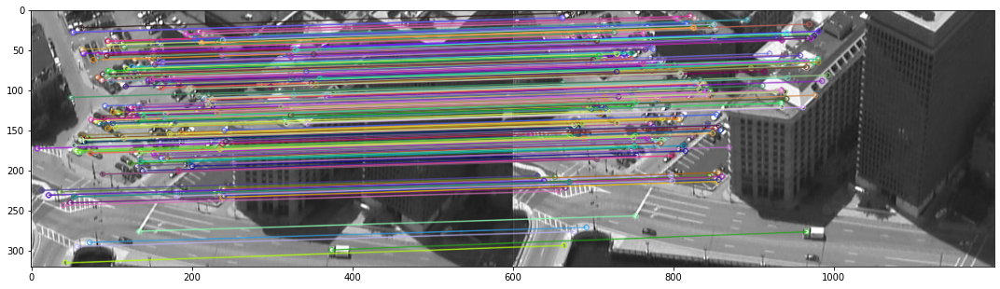

In [50]:
# Compute fundamental matrix between image 1 and 2 #

# Read images
img1 = cv2.imread('Data/frame_00000.tif',cv2.IMREAD_GRAYSCALE)
img2 = cv2.imread('Data/frame_00001.tif',cv2.IMREAD_GRAYSCALE)
img1 = img1[400:, :600]
img2 = img2[400:, :600]

# # If we want to use ORB
# orb = cv2.ORB_create(nfeatures=4000,scaleFactor =1.1, edgeThreshold = 19, patchSize = 19)
# find the keypoints and descriptors with ORB
# kp1, des1 = orb.detectAndCompute(img1,None)
# kp2, des2 = orb.detectAndCompute(img2,None)
# create BFMatcher object
# bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
# # Match descriptors.
# matches_12 = bf.match(des1,des2)

SIFTdetector = cv2.xfeatures2d.SIFT_create(nfeatures=500)
kp1, des1 = SIFTdetector.detectAndCompute(img1,None)
kp2, des2 = SIFTdetector.detectAndCompute(img2,None)
bf = cv2.BFMatcher()
matches_init = bf.knnMatch(des1,des2,k=2)
# Apply ratio test
matches_12 = []
for m,n in matches_init:
    if m.distance < 0.65*n.distance:
        matches_12.append(m)

# Show matches
img_12 = cv2.drawMatches(img1,kp1,img2,kp2,matches_12,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.imshow(img_12)
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(18.5, 10.5)
plt.show()

<span style='color:Blue'> We're using SIFT, so we cannot use the idx1 (=123) provided by the teacher, as that index
corresponds to the keypoint computed using ORB. To find the new index of the keypoints, we can use the information
provided by the image 2. As we can see, the keypoint that corresponds to the van is the only one with a height > 250
and width > 300 (900 in the image, as the axis starts in 600). We use this information to obtain the index of the match (matches_12\[idx]) that is matching that 
keypoint of image 2: </span>

In [47]:
for idx,im in enumerate(matches_12):
    tmp_kp2 = kp2[im.trainIdx].pt
    if tmp_kp2[0] > 300 and tmp_kp2[1] > 250:
        print(f'{idx}: {tmp_kp2}')

32: (365.9320373535156, 276.12091064453125)


<span style='color:Blue'> It seems that the index 32 of matches_12 corresponds to the match between the keypoints 
detected on the van for images 1 and 2. Le'ts check it plotting only that keypoints: </span>

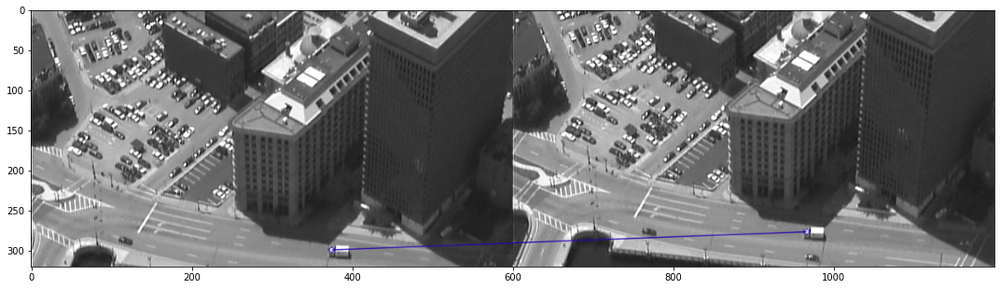

In [52]:
# Show only match 32
img_12 = cv2.drawMatches(img1,kp1,img2,kp2,[matches_12[32]],None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.imshow(img_12)
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(18.5, 10.5)
plt.show()

<span style='color:Blue'> Correct! Now we can get the idx1 and idx2 corresponding to these keypoints: </span>

In [53]:
idx1 = matches_12[32].queryIdx
idx2 = matches_12[32].trainIdx

<span style='color:Blue'> And estimate the fundamental matrix: </span>

Total # iterations: 4
Total # inliers: 264


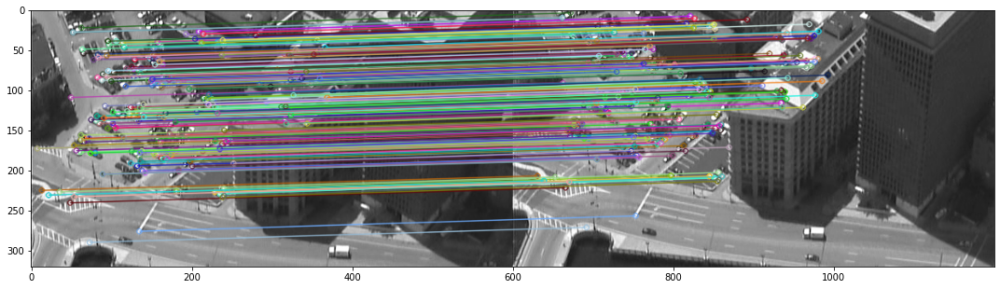

In [54]:
# Robust estimation of the fundamental matrix #
points1 = []
points2 = []
for m in matches_12:
    points1.append([kp1[m.queryIdx].pt[0], kp1[m.queryIdx].pt[1], 1])
    points2.append([kp2[m.trainIdx].pt[0], kp2[m.trainIdx].pt[1], 1])
    
points1 = np.asarray(points1)
points1 = points1.T
points2 = np.asarray(points2)
points2 = points2.T

F, indices_inlier_matches = Ransac_fundamental_matrix(points1, points2, 1, 5000)
inlier_matches_12 = itemgetter(*indices_inlier_matches)(matches_12)

img_12 = cv2.drawMatches(img1,kp1,img2,kp2,inlier_matches_12,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.imshow(img_12)
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(18.5, 10.5)
plt.show()

<span style='color:Blue'> Now let's do the same for image 3: </span>

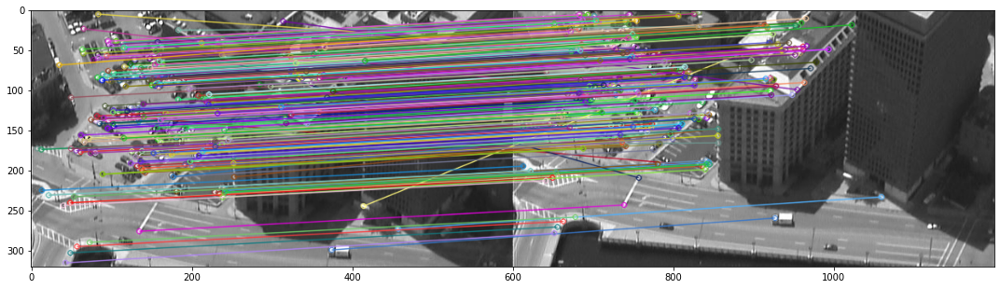

Total # iterations: 4
Total # inliers: 258


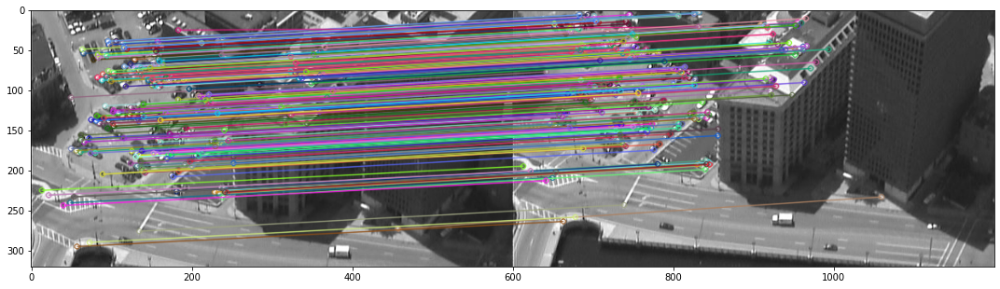

True

In [92]:
# Compute fundamental matrix between image 1 and 3 #

# Read images
img3 = cv2.imread('Data/frame_00002.tif',cv2.IMREAD_GRAYSCALE)
img3 = img3[400:, :600]

kp3, des3 = SIFTdetector.detectAndCompute(img3,None)
bf = cv2.BFMatcher()
matches_init = bf.knnMatch(des1,des3,k=2)
# Apply ratio test
matches_13 = []
for m,n in matches_init:
    if m.distance < 0.85*n.distance:
        matches_13.append(m)

# Show matches 
img_13 = cv2.drawMatches(img1,kp1,img3,kp3,matches_13,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.imshow(img_13)
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(18.5, 10.5)
plt.show()

# Robust estimation of the fundamental matrix #
points1 = []
points3 = []
for m in matches_13:
    points1.append([kp1[m.queryIdx].pt[0], kp1[m.queryIdx].pt[1], 1])
    points3.append([kp3[m.trainIdx].pt[0], kp3[m.trainIdx].pt[1], 1])
    
points1 = np.asarray(points1)
points1 = points1.T
points3 = np.asarray(points3)
points3 = points3.T

F_13, indices_inlier_matches_13 = Ransac_fundamental_matrix(points1, points3, 1, 5000)
inlier_matches_13 = itemgetter(*indices_inlier_matches_13)(matches_13)

img_13 = cv2.drawMatches(img1,kp1,img3,kp3,inlier_matches_13,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.imshow(img_13)
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(18.5, 10.5)
plt.show()

<span style='color:Blue'> We wanted to include another frame (frame_00003.tif), so let's add it as img4: </span>

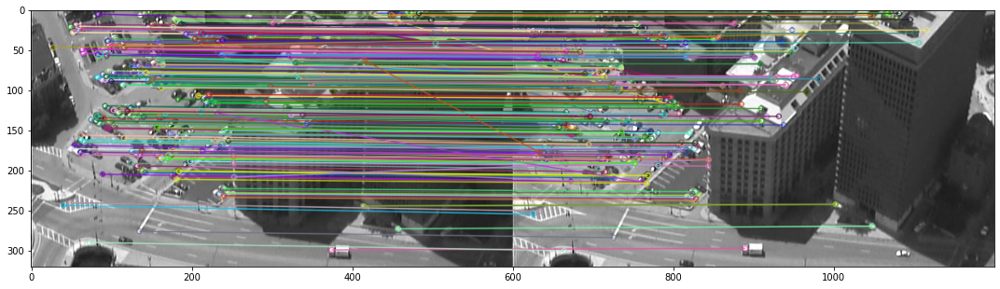

Total # iterations: 5
Total # inliers: 260


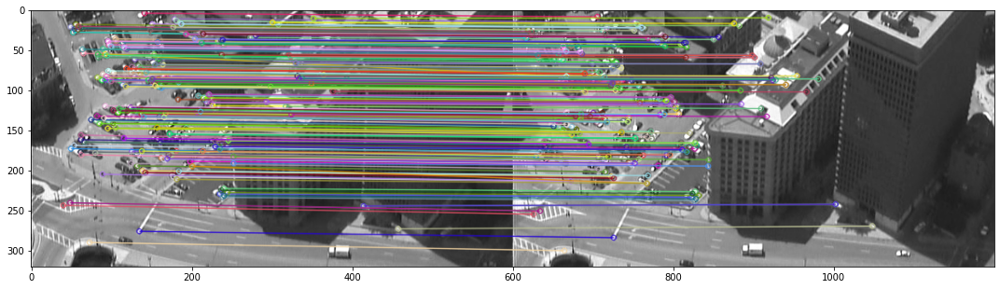

True

In [93]:
# Compute fundamental matrix between image 1 and 4 #

# Read images
img4 = cv2.imread('Data/frame_00003.tif',cv2.IMREAD_GRAYSCALE)
img4 = img4[400:, :600]

kp4, des4 = SIFTdetector.detectAndCompute(img4,None)
bf = cv2.BFMatcher()
matches_init = bf.knnMatch(des1,des4,k=2)
# Apply ratio test
matches_14 = []
for m,n in matches_init:
    if m.distance < 0.85*n.distance:
        matches_14.append(m)

# Show matches 
img_14 = cv2.drawMatches(img1,kp1,img4,kp4,matches_14,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.imshow(img_14)
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(18.5, 10.5)
plt.show()

# Robust estimation of the fundamental matrix #
points1 = []
points4 = []
for m in matches_14:
    points1.append([kp1[m.queryIdx].pt[0], kp1[m.queryIdx].pt[1], 1])
    points4.append([kp4[m.trainIdx].pt[0], kp4[m.trainIdx].pt[1], 1])
    
points1 = np.asarray(points1)
points1 = points1.T
points4 = np.asarray(points4)
points4 = points4.T

F_14, indices_inlier_matches_14 = Ransac_fundamental_matrix(points1, points4, 1, 5000)
inlier_matches_14 = itemgetter(*indices_inlier_matches_14)(matches_14)

img_14 = cv2.drawMatches(img1,kp1,img4,kp4,inlier_matches_14,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.imshow(img_14)
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(18.5, 10.5)
plt.show()

<span style='color:Green'> - Complete the code to automatically identify the corresponding point of idx1 in 
images 2, 3 and 4 (you may use the previously computed matches for that). </span>

In [94]:
# We'll use the previous idx1 and matches_13 to get idx3: 
for idx,m in enumerate(matches_13):
    if m.queryIdx == idx1:
        idx3 = m.trainIdx
        break

# We'll use the previous idx1 and matches_14 to get idx4: 
for idx,m in enumerate(matches_14):
    if m.queryIdx == idx1:
        idx4 = m.trainIdx
        break

# Get the point coordinates
(x1, y1) = kp1[idx1].pt
(x2, y2) = kp2[idx2].pt
(x3, y3) = kp3[idx3].pt
(x4, y4) = kp4[idx4].pt

<span style='color:Green'> - Complete the code that computes the projection of the van trajectory in image 1. </span>


In [61]:
point1 = np.array([x1, y1, 1]) # 1st point of the trajectory projected in image 1
point1_2 = np.array([334, 293, 1]) # 2nd point of the trajectory projected in image 1

trajectory = np.cross(point1, point1_2)

<span style='color:Blue'> Let's plot the trajectory line: </span>

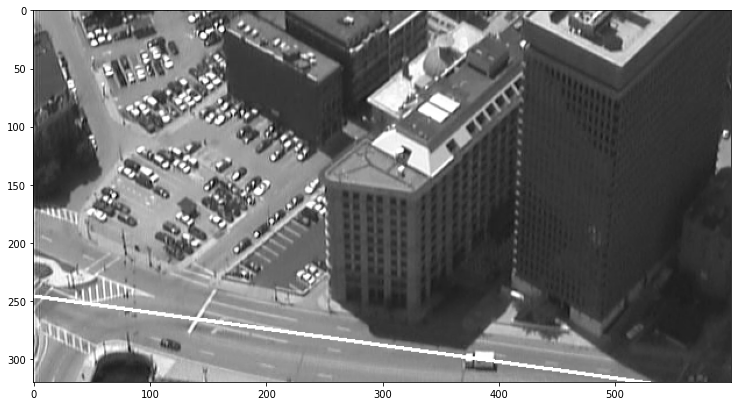

In [62]:
img_path = 'Data/frame_00000.tif'
I = Image.open(img_path).convert('RGB')
w, h = I.size
I = I.crop((0, 400, 600, h))
canv = ImageDraw.Draw(I)
line_draw(trajectory, canv, [w,h])
fig = plot_img(I)
fig.set_size_inches(12.5, 8.5)

<span style='color:Green'> - Complete the code that computes the projection of the 3D position of the van in the time instances corresponding to images 2 and 3 (points (x12, y12) and (x13, y13) respectively). </span>

<Figure size 1332x756 with 0 Axes>

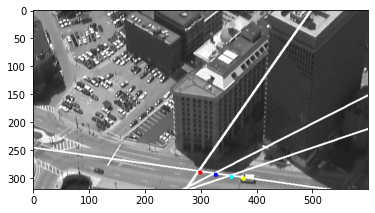

In [95]:
epiline1 = F.T @ [x2, y2, 1] # epipolar line in image 1 of point of image 2
point12_proj = np.cross(trajectory, epiline1)
x12, y12 = point12_proj[:2]/point12_proj[2]

epiline2 = F_13.T @ [x3, y3, 1] # epipolar line in image 1 of point of image 3
point13_proj = np.cross(trajectory, epiline2)
x13, y13 = point13_proj[:2]/point13_proj[2]

epiline3 = F_14.T @ [x4, y4, 1] # epipolar line in image 1 of point of image 4
point14_proj = np.cross(trajectory, epiline3)
x14, y14 = point14_proj[:2]/point14_proj[2]

img_path = "Data/frame_00000.tif"
I = Image.open(img_path).convert('RGB')
w, h = I.size
I2 = I.crop((0, 400, 600, h))
canv2 = ImageDraw.Draw(I2)
line_draw(trajectory, canv2, size)
canv2.ellipse((x1, y1, x1+7, y1+7), fill = 'yellow', outline ='yellow')

line_draw(epiline1, canv2, size)
canv2.ellipse((x12, y12, x12+7, y12+7), fill = 'cyan', outline ='cyan')

line_draw(epiline2, canv2, size)
canv2.ellipse((x13, y13, x13+7, y13+7), fill = 'blue', outline ='blue')

line_draw(epiline3, canv2, size)
canv2.ellipse((x14, y14, x14+7, y14+7), fill = 'red', outline ='red')

fig = matplotlib.pyplot.gcf()
fig.set_size_inches(18.5, 10.5)
plot_img(I2)

<span style='color:Blue'> We find as a good practice, due to the randomness of the RANSAC algorithm,
to save in a pickle the parameters (keypoints, descriptors and fundamental matrix) that provide us good results. </span>

In [96]:
# Keypoints can't be pickled straight away, so we have to serialize them.
def pickle_kp(kp):
    pickled_kp = []
    for point in kp:
        temp = (point.pt, point.size, point.angle, point.response, point.octave, 
            point.class_id) 
        pickled_kp.append(temp)
    return pickled_kp

pickled_kp1 = pickle_kp(kp1)
pickled_kp2 = pickle_kp(kp2)
pickled_kp3 = pickle_kp(kp3)
pickled_kp4 = pickle_kp(kp4)

In [97]:
# Dump data to pickle files
with open('./pickle/image12.pkl', 'wb+') as f:
    data = {
        'kp1': pickled_kp1,
        'kp2': pickled_kp2,
        'des1': des1,
        'des2': des2,
        'F': F
    }
    pickle.dump(data, f)
    
with open('./pickle/image13.pkl', 'wb+') as f:
    data = {
        'kp3': pickled_kp3,
        'des3': des3,
        'F': F_13
        }
    pickle.dump(data, f)

with open('./pickle/image14.pkl', 'wb+') as f:
    data = {
        'kp4': pickled_kp4,
        'des4': des4,
        'F': F_14
        }
    pickle.dump(data, f)    

<span style='color:Blue'> In order to recover the pickles we should first load the pickle files: </span>

In [98]:
path_pickle12 = './pickle/image12.pkl'
path_pickle13 = './pickle/image13.pkl'
path_pickle14 = './pickle/image14.pkl'

with open(path_pickle12, 'rb') as f:
    pickle_image12 = pickle.load(f)

with open(path_pickle13, 'rb') as f:
    pickle_image13 = pickle.load(f)

with open(path_pickle14, 'rb') as f:
    pickle_image14 = pickle.load(f)

<span style='color:Blue'> And then deserialize the keypoints: </span>

In [99]:
def unpickle_kp(pickled_kp):
    kp = []

    for point in pickled_kp:
        temp = cv2.KeyPoint(x=point[0][0],y=point[0][1],_size=point[1], _angle=point[2], 
                                _response=point[3], _octave=point[4], _class_id=point[5]) 
        kp.append(temp)
    
    return kp
    
kp1 = unpickle_kp(pickle_image12['kp1'])
kp2 = unpickle_kp(pickle_image12['kp2'])
kp3 = unpickle_kp(pickle_image13['kp3'])
kp4 = unpickle_kp(pickle_image14['kp4'])

<span style='color:Blue'> Finally, we can use the keypoints and the descriptors to compute the matches. We could also
pickle the matches, but we would need to serialize them as well, so it's easier to compute them again: </span>

In [101]:
des1 = pickle_image12['des1']
des2 = pickle_image12['des2']
des3 = pickle_image13['des3']
des4 = pickle_image14['des4']

bf = cv2.BFMatcher()

# matches between images 1 and 2
matches_init = bf.knnMatch(des1,des2,k=2)
matches_12 = []
for m,n in matches_init:
    if m.distance < 0.65*n.distance:
        matches_12.append(m)

# matches between images 1 and 3
matches_init = bf.knnMatch(des1,des3,k=2)
matches_13 = []
for m,n in matches_init:
    if m.distance < 0.85*n.distance:
        matches_13.append(m)

# matches between images 1 and 4
matches_init = bf.knnMatch(des1,des4,k=2)
matches_14 = []
for m,n in matches_init:
    if m.distance < 0.85*n.distance:
        matches_14.append(m)

# and we finally load the fundamental matrix
F = pickle_image12['F']
F_13 = pickle_image13['F']
F_14 = pickle_image14['F']

<span style='color:Blue'> With the fundamental matrix and the matches, we can obtain the desired results again. </span>

# Optional: Our own images

<span style='color:Blue'> We wanted to test the system in a different environment, taking the pictures by 
ourselves and running the algorithm on them. </span>

## 1. Two oposite trajectories with the same image frames
<span style='color:Blue'> Our first experiment is to obtain the trajectories of two objects that move in opposite 
directions: a pedestrian walking on the sideway and a van. To light the notebook a little bit, we will only show the matches and procedure for the pedestrian, show the results for the van and comment them in the report.</span>

In [102]:
# As the quality of the image is too high we have to down-sized for a faster processing and to easily 
# visualize the keypoint matches
def resize_img(img,scale_percent):
    width = int(img.shape[1] * scale_percent / 100)
    height = int(img.shape[0] * scale_percent / 100)
    dim = (width, height)
    
    # resize image
    return cv2.resize(img, dim, interpolation = cv2.INTER_AREA)

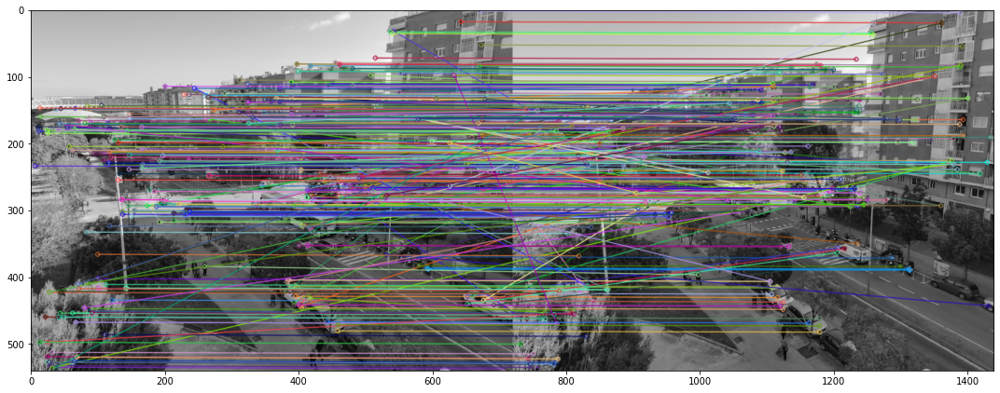

True

In [103]:
# Compute fundamental matrix between image 1 and 2 #

# Read images
img1 = cv2.imread('Data/street/frame_1.jpg',cv2.IMREAD_GRAYSCALE)
img2 = cv2.imread('Data/street/frame_2.jpg',cv2.IMREAD_GRAYSCALE)

img1 = resize_img(img1,18)
img2 = resize_img(img2,18)

SIFTdetector = cv2.xfeatures2d.SIFT_create(nfeatures=500)
kp1, des1 = SIFTdetector.detectAndCompute(img1,None)
kp2, des2 = SIFTdetector.detectAndCompute(img2,None)
bf = cv2.BFMatcher()
matches_init = bf.knnMatch(des1,des2,k=2)
# Apply ratio test
matches_12 = []
for m,n in matches_init:
    if m.distance < 0.95*n.distance: 
        matches_12.append(m)

# Show matches. pedestrian: [matches[199]], van: [matches[193]], all: matches_12
img_12 = cv2.drawMatches(img1,kp1,img2,kp2,matches_12,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.imshow(img_12)
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(18.5, 10.5)
plt.show()

<span style='color:Blue'> We find the match of interest on index 199: </span>

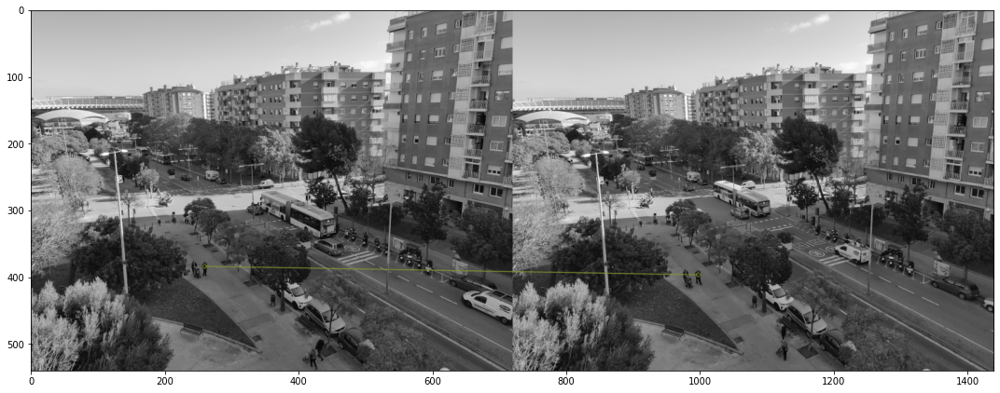

True

In [104]:
# Show matches. pedestrian: [matches[199]], van: [matches[193]], all: matches_12
img_12 = cv2.drawMatches(img1,kp1,img2,kp2,[matches_12[199]],None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.imshow(img_12)
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(18.5, 10.5)
plt.show()

<span style='color:Blue'> Let's estimate the fundamental matrix: </span>

Total # iterations: 9
Total # inliers: 318


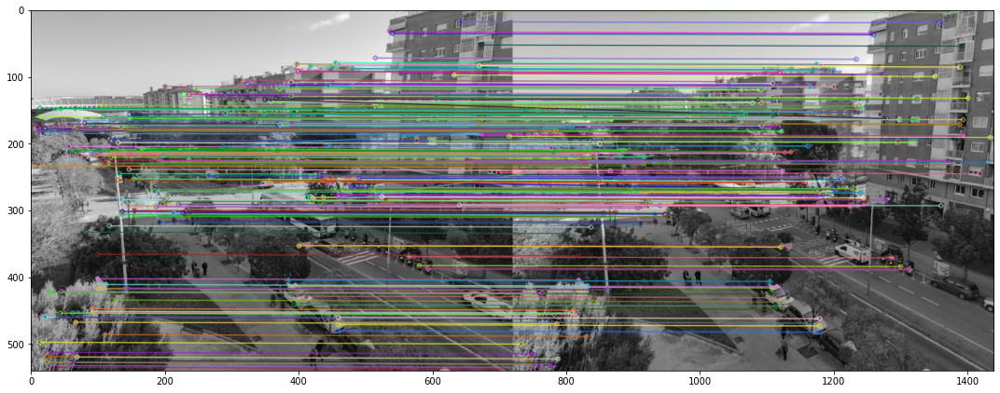

True

In [116]:
# Robust estimation of the fundamental matrix #
points1 = []
points2 = []
for m in matches_12:
    points1.append([kp1[m.queryIdx].pt[0], kp1[m.queryIdx].pt[1], 1])
    points2.append([kp2[m.trainIdx].pt[0], kp2[m.trainIdx].pt[1], 1])
    
points1 = np.asarray(points1)
points1 = points1.T
points2 = np.asarray(points2)
points2 = points2.T

F, indices_inlier_matches = Ransac_fundamental_matrix(points1, points2, 1, 5000)
inlier_matches_12 = itemgetter(*indices_inlier_matches)(matches_12)

img_12 = cv2.drawMatches(img1,kp1,img2,kp2,inlier_matches_12,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.imshow(img_12)
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(18.5, 10.5)
plt.show()

<span style='color:Blue'> Idem for image 3: </span>

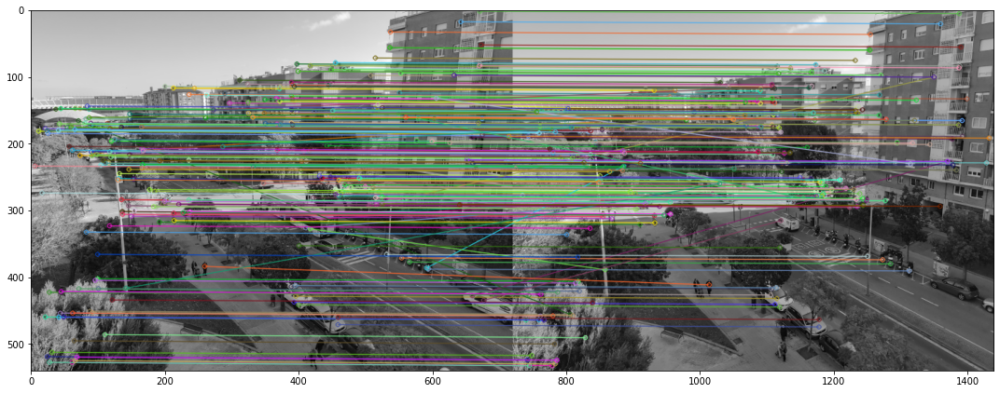

True

In [110]:
# Compute fundamental matrix between image 1 and 3 #

# Read images
img3 = cv2.imread('Data/street/frame_4.jpg',cv2.IMREAD_GRAYSCALE)

img3 = resize_img(img3,18)

kp3, des3 = SIFTdetector.detectAndCompute(img3,None)
bf = cv2.BFMatcher()
matches_init = bf.knnMatch(des1,des3,k=2)
# Apply ratio test
matches_13 = []
for m,n in matches_init:
    if m.distance < 0.85*n.distance: 
        matches_13.append(m)

# Show matches 
img_13 = cv2.drawMatches(img1,kp1,img3,kp3,matches_13,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.imshow(img_13)
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(18.5, 10.5)
plt.show()

<span style='color:Blue'> Here, the index of the match of interest is 163: </span>

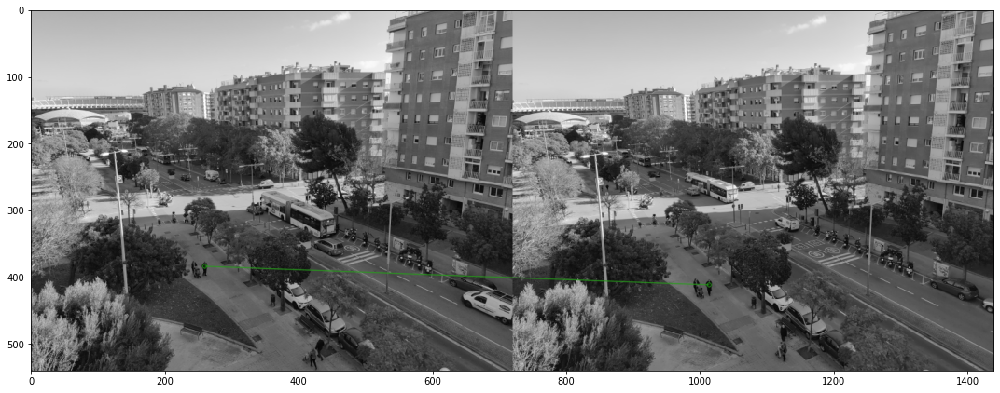

True

In [111]:
# Show matches 
img_13 = cv2.drawMatches(img1,kp1,img3,kp3,[matches_13[163]],None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.imshow(img_13)
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(18.5, 10.5)
plt.show()

<span style='color:Blue'> Let's estimate the fundamental matrix: </span>

Total # iterations: 4
Total # inliers: 283


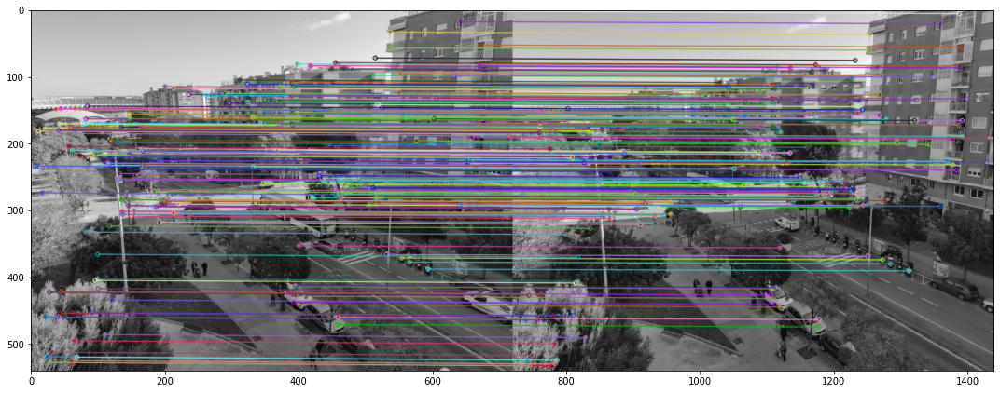

True

In [117]:
# Robust estimation of the fundamental matrix #
points1 = []
points3 = []
for m in matches_13:
    points1.append([kp1[m.queryIdx].pt[0], kp1[m.queryIdx].pt[1], 1])
    points3.append([kp3[m.trainIdx].pt[0], kp3[m.trainIdx].pt[1], 1])
    
points1 = np.asarray(points1)
points1 = points1.T
points3 = np.asarray(points3)
points3 = points3.T

F_13, indices_inlier_matches_13 = Ransac_fundamental_matrix(points1, points3, 1, 5000)
inlier_matches_13 = itemgetter(*indices_inlier_matches_13)(matches_13)

img_13 = cv2.drawMatches(img1,kp1,img3,kp3,inlier_matches_13,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.imshow(img_13)
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(18.5, 10.5)
plt.show()

<span style='color:Blue'> We obtain the corresponding points coordinates and compute the trajectory line: </span>

In [118]:
idx1 = matches_12[199].queryIdx # pedestrian: 199, van: 193

for idx,m in enumerate(matches_12):
    if m.queryIdx == idx1:
        idx2 = m.trainIdx
        break

for idx,m in enumerate(matches_13):
    if m.queryIdx == idx1:
        idx3 = m.trainIdx
        break
           
# Get the point coordinates
(x1, y1) = kp1[idx1].pt
(x2, y2) = kp2[idx2].pt
(x3, y3) = kp3[idx3].pt

point1 = np.array([x1, y1, 1]) # 1st point of the trajectory projected in image 1
point1_2 = np.array([325, 450, 1]) # 2nd point of the trajectory projected in image 1 
                                   # for the van 350, 300

trajectory = np.cross(point1, point1_2)

<span style='color:Blue'> And we finally find the corresponding projection of the 3D position of the person in the
time instances corresponding to images 2 and 3: </span>

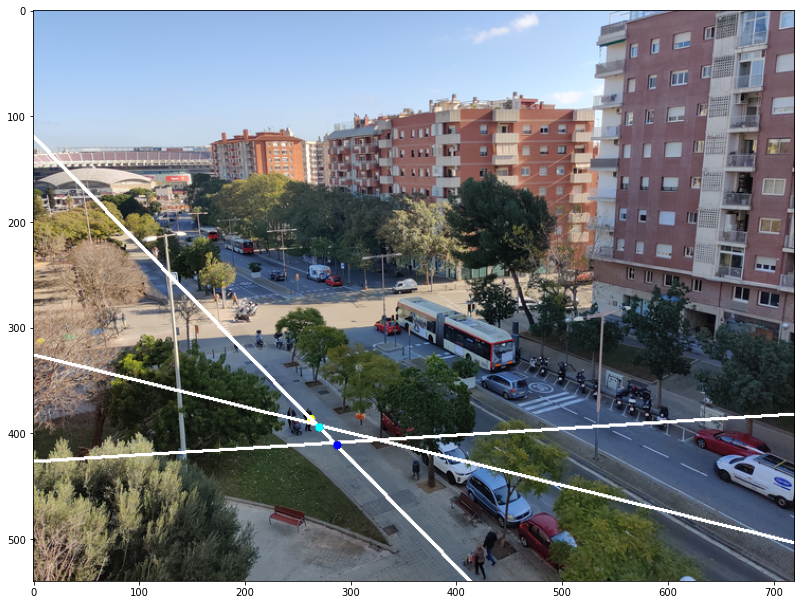

In [120]:
epiline1 = F.T @ [x2, y2, 1] # epipolar line in image 1 of point of image 2
point12_proj = np.cross(trajectory, epiline1)
x12, y12 = point12_proj[:2]/point12_proj[2]

epiline2 = F_13.T @ [x3, y3, 1] # epipolar line in image 1 of point of image 2
point13_proj = np.cross(trajectory, epiline2)
x13, y13 = point13_proj[:2]/point13_proj[2]

img_path = "Data/street/frame_1.jpg"
I = Image.open(img_path).convert('RGB')

w, h = I.size
resize_factor=0.18
I.thumbnail((int(w*resize_factor),int(h*resize_factor)), Image.ANTIALIAS)
size=I.size

canv2 = ImageDraw.Draw(I)
canv2.ellipse((x1, y1, x1+7, y1+7), fill = 'yellow', outline ='yellow')
line_draw(trajectory, canv2, size)
line_draw(epiline1, canv2, size)
canv2.ellipse((x12, y12, x12+7, y12+7), fill = 'cyan', outline ='cyan')
line_draw(epiline2, canv2, size)
canv2.ellipse((x13, y13, x13+7, y13+7), fill = 'blue', outline ='blue')

fig = plot_img(I)
fig.set_size_inches(18.5, 10.5)   

<span style='color:Blue'> If we use the indices corresponding to the van we will obtain the following result. As we 
can see, we detect correctly a trajectory on the opposite direct. </span>

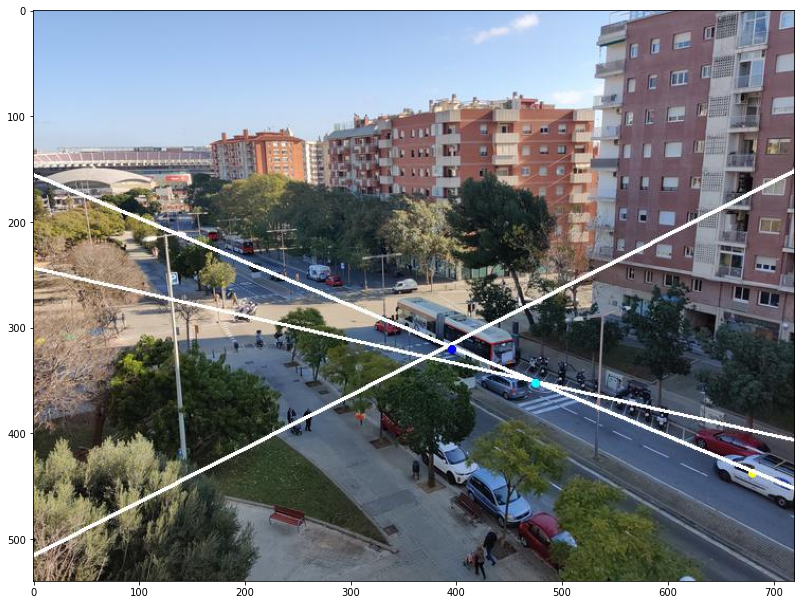

In [121]:
van_image = cv2.imread('Data/street/van_trajectory.jpg')
van_image = cv2.cvtColor(van_image, cv2.COLOR_BGR2RGB)
plt.imshow(van_image)
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(18.5, 10.5)
plt.show()

## 2. Predicting the trajectory of Nala

<span style='color:Blue'> In the second experiment we want to obtain the trajectory of Nala (Òscar's cat). Here, 
we face one extra challenge: the camera is really close to Nala and she's moving really fast, so the resulting images 
will be blurry. For this reason, we had to tweak the parameters of the keypoint detector and matching function in order 
to get useful matches and thus a correct estimation of F. The randomness of RANSAC also plays a role here, as we have
some outliers in matches_13, so we recommend not to run the code at first to see the results. </span>

In [122]:
# Read images
img1 = cv2.imread('Data/nala/3.jpeg',cv2.IMREAD_GRAYSCALE)
img2 = cv2.imread('Data/nala/8.jpeg',cv2.IMREAD_GRAYSCALE)
img3 = cv2.imread('Data/nala/12.jpeg',cv2.IMREAD_GRAYSCALE)

# Resize them
resize_factor = 0.25
img1 = cv2.resize(img1.copy(), (int(img1.shape[1]*resize_factor), int(img1.shape[0]*resize_factor)))
img2 = cv2.resize(img2.copy(), (int(img2.shape[1]*resize_factor), int(img2.shape[0]*resize_factor)))
img3 = cv2.resize(img3.copy(), (int(img3.shape[1]*resize_factor), int(img3.shape[0]*resize_factor)))

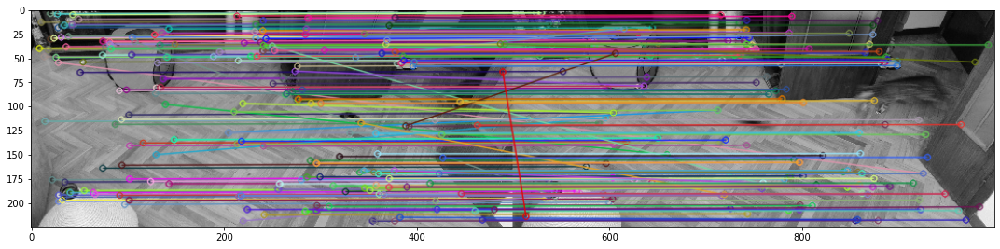

In [124]:
SIFTdetector = cv2.xfeatures2d.SIFT_create(nfeatures=500)
kp1, des1 = SIFTdetector.detectAndCompute(img1,None)
kp2, des2 = SIFTdetector.detectAndCompute(img2,None)
bf = cv2.BFMatcher()
matches_init = bf.knnMatch(des1,des2,k=2)

# Apply ratio test
matches_12 = []
for m,n in matches_init:
    if m.distance < 0.85*n.distance:
        matches_12.append(m)

# Show matches
img_12 = cv2.drawMatches(img1,kp1,img2,kp2,matches_12,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.imshow(img_12)
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(18.5, 10.5)
plt.show()

<span style='color:Blue'> We find the match of interest on index 192: </span>

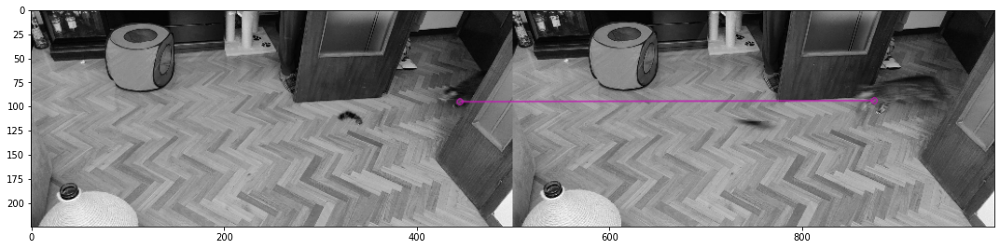

In [134]:
# Show matches
img_12 = cv2.drawMatches(img1,kp1,img2,kp2,[matches_12[192]],None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.imshow(img_12)
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(18.5, 10.5)
plt.show()

<span style='color:Blue'> Let's estimate the fundamental matrix: </span>

Total # iterations: 4
Total # inliers: 189


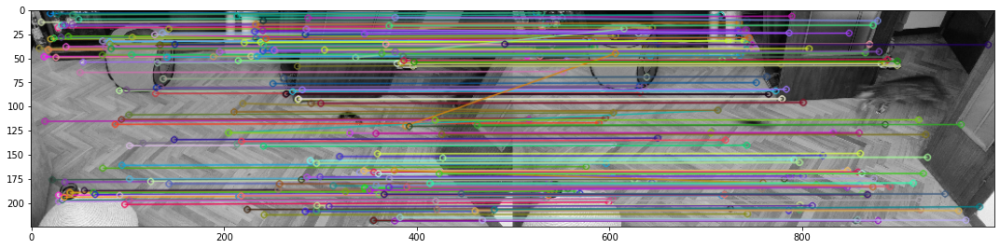

True

In [152]:
# Robust estimation of the fundamental matrix #
points1 = []
points2 = []
for m in matches_12:
    points1.append([kp1[m.queryIdx].pt[0], kp1[m.queryIdx].pt[1], 1])
    points2.append([kp2[m.trainIdx].pt[0], kp2[m.trainIdx].pt[1], 1])
    
points1 = np.asarray(points1)
points1 = points1.T
points2 = np.asarray(points2)
points2 = points2.T

F, indices_inlier_matches = Ransac_fundamental_matrix(points1, points2, 1, 5000)
inlier_matches_12 = itemgetter(*indices_inlier_matches)(matches_12)

img_12 = cv2.drawMatches(img1,kp1,img2,kp2,inlier_matches_12,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.imshow(img_12)
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(18.5, 10.5)
plt.show()

<span style='color:Blue'> Idem for image 3: </span>

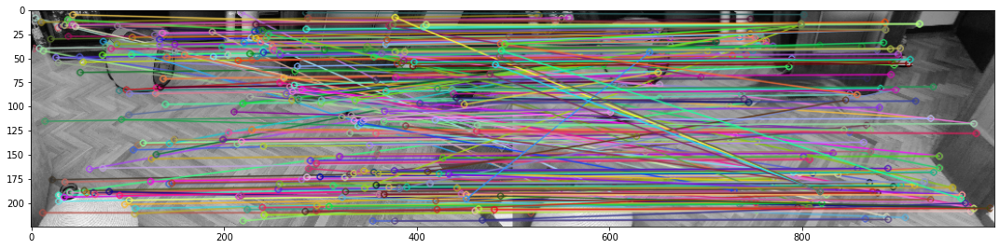

In [138]:
kp3, des3 = SIFTdetector.detectAndCompute(img3,None)
bf = cv2.BFMatcher()
matches_init = bf.knnMatch(des1,des3,k=2)
# Apply ratio test
matches_13 = []
for m,n in matches_init:
    if m.distance < 0.95*n.distance:
        matches_13.append(m)

# Show matches 
img_13 = cv2.drawMatches(img1,kp1,img3,kp3,matches_13,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.imshow(img_13)
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(18.5, 10.5)
plt.show()

<span style='color:Blue'> Here, the index of the match of interest is 245 (yes, it took some time to get it right).
We cannot use idx1 to get idx3 because the match between images 1 and 2 and images 1 and 3 don't use the same kp1. </span>

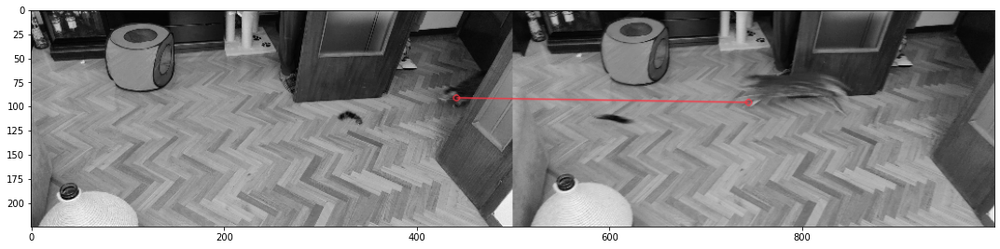

In [147]:
# Show matches 
img_13 = cv2.drawMatches(img1,kp1,img3,kp3,[matches_13[245]],None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.imshow(img_13)
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(18.5, 10.5)
plt.show()

<span style='color:Blue'> Let's estimate the fundamental matrix: </span>

Total # iterations: 26
Total # inliers: 170


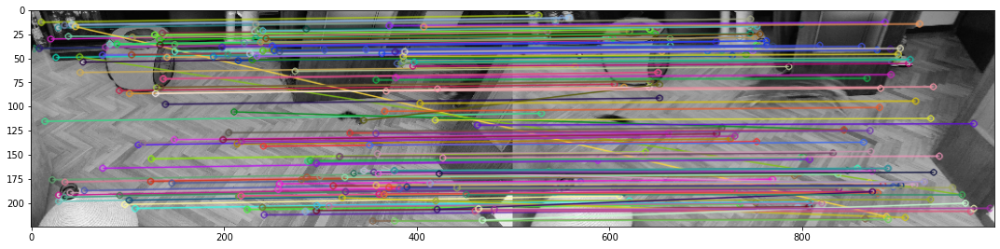

True

In [153]:
# Robust estimation of the fundamental matrix #
points1 = []
points3 = []
for m in matches_13:
    points1.append([kp1[m.queryIdx].pt[0], kp1[m.queryIdx].pt[1], 1])
    points3.append([kp3[m.trainIdx].pt[0], kp3[m.trainIdx].pt[1], 1])
    
points1 = np.asarray(points1)
points1 = points1.T
points3 = np.asarray(points3)
points3 = points3.T

F_13, indices_inlier_matches_13 = Ransac_fundamental_matrix(points1, points3, 1, 5000)
inlier_matches_13 = itemgetter(*indices_inlier_matches_13)(matches_13)

img_13 = cv2.drawMatches(img1,kp1,img3,kp3,inlier_matches_13,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.imshow(img_13)
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(18.5, 10.5)
plt.show()

<span style='color:Blue'> We obtain the corresponding points coordinates and compute the trajectory: </span>

In [150]:
idx1 = matches_12[192].queryIdx
idx2 = matches_12[192].trainIdx
idx3 = matches_13[245].trainIdx

# Get the point coordinates
(x1, y1) = kp1[idx1].pt
(x2, y2) = kp2[idx2].pt
(x3, y3) = kp3[idx3].pt

point1 = np.array([x1, y1, 1]) # 1st point of the trajectory projected in image 1
point1_2 = np.array([189, 110, 1]) # 2nd point of the trajectory projected in image 1
trajectory = np.cross(point1, point1_2)

<span style='color:Blue'> And we finally find the corresponding projection of the 3D position of Nala in the
time instances corresponding to images 2 and 3: </span>

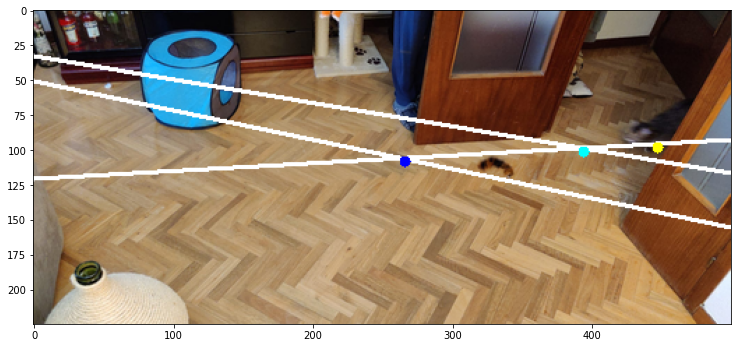

In [154]:
epiline1 = F.T @ [x2, y2, 1] # epipolar line in image 1 of point of image 2
point12_proj = np.cross(trajectory, epiline1)
x12, y12 = point12_proj[:2]/point12_proj[2]

epiline2 = F_13.T @ [x3, y3, 1] # epipolar line in image 1 of point of image 2
point13_proj = np.cross(trajectory, epiline2)
x13, y13 = point13_proj[:2]/point13_proj[2]

img_path = "Data/nala/3.jpeg"
I = Image.open(img_path).convert('RGB')
w, h = I.size
resize=0.25
I.thumbnail((int(w*resize_factor),int(h*resize_factor)), Image.ANTIALIAS)
canv2 = ImageDraw.Draw(I)
line_draw(trajectory, canv2, I.size)
canv2.ellipse((x1, y1, x1+7, y1+7), fill = 'yellow', outline ='yellow')

line_draw(epiline1, canv2, I.size)
canv2.ellipse((x12, y12, x12+7, y12+7), fill = 'cyan', outline ='cyan')

line_draw(epiline2, canv2, I.size)
canv2.ellipse((x13, y13, x13+7, y13+7), fill = 'blue', outline ='blue')

fig = plot_img(I)
fig.set_size_inches(12.5, 8.5)